
<a name='toc'></a>  TOC

* <a href='#me.01.t1'> Modeling and Evaluation 1</a> :
            Train and adjust parameters  
            
  - <a href='#spectral'>SpectralClustering</a>
  - <a href='#end_of_file'> end of file</a>


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
import warnings
warnings.simplefilter('ignore',DeprecationWarning)
import seaborn as sns
import time
import copy

from pylab import rcParams
#import hdbscan

from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler

#from sklearn.datasets import make_blobs

from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

from sklearn import metrics
from sklearn import metrics as mt
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import confusion_matrix as conf
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score

from sklearn.cluster import KMeans

from tabulate import tabulate

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from __future__ import print_function

#### Read in cleaned  dataset from .csv file  

In [37]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in cleaned data set
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 'mashable_clean_dataset_for_lab_03.csv'

file_2_read = data_dir + data_file
df = pd.read_csv(file_2_read)

df_cluster = copy.deepcopy(df)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... add 'popular' binary based 'shares' values
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_cluster['shares'] = np.exp(df_cluster['ln_shares'])
df_cluster['popular'] = np.where(df_cluster['shares'] > 1400, 1, 0)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in t-SNE vectors
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 't_sne_mapping_perplex_0050.csv'

file_2_read = data_dir + data_file
df_tsne = pd.read_csv(file_2_read)

df_tsne.head()


# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... join t-sne vectors with base data, since we sampled to create
# ...     the t-sne mapping
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_join = df_tsne.join(df_cluster, on = 'sample_index')

df_join.head()


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,...,ln_self_reference_avg_sharess,ln_LDA_00,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares
0,12,5,0,1,0,1.800304,1,0,0,0,...,6.208590,0.405686,0.320836,0.039225,0.040434,0.039339,0.013606,0.095310,0.171850,6.385194
1,9,4,0,0,0,1.800304,1,0,0,0,...,0.000000,0.587651,0.048835,0.048882,0.048886,0.048791,0.015565,0.032790,0.000000,6.566672
2,9,6,0,0,0,1.800304,1,0,0,0,...,6.823286,0.197040,0.032791,0.032807,0.032790,0.520096,0.009434,0.095310,0.000000,7.313220
3,9,7,0,1,0,1.800304,1,0,0,0,...,0.000000,0.028173,0.350164,0.401893,0.028495,0.028171,0.020504,0.127833,0.000000,7.090077
4,13,7,0,0,0,1.800304,1,0,0,0,...,8.055843,0.028231,0.028387,0.028175,0.028171,0.634154,0.012054,0.032790,0.127833,6.224558


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,12,5,0,1,0,1.800304,1,0,0,0,...,0.320836,0.039225,0.040434,0.039339,0.013606,0.095310,0.171850,6.385194,593.0,0
1,9,4,0,0,0,1.800304,1,0,0,0,...,0.048835,0.048882,0.048886,0.048791,0.015565,0.032790,0.000000,6.566672,711.0,0
2,9,6,0,0,0,1.800304,1,0,0,0,...,0.032791,0.032807,0.032790,0.520096,0.009434,0.095310,0.000000,7.313220,1500.0,1
3,9,7,0,1,0,1.800304,1,0,0,0,...,0.350164,0.401893,0.028495,0.028171,0.020504,0.127833,0.000000,7.090077,1200.0,0
4,13,7,0,0,0,1.800304,1,0,0,0,...,0.028387,0.028175,0.028171,0.634154,0.012054,0.032790,0.127833,6.224558,505.0,0


,x-tsne,y-tsne,sample_index
0,-20.787914,18.620035,22306
1,-5.354161,-37.568569,744
2,-22.119318,3.339696,24340
3,16.412754,19.477648,35153
4,-6.188030,9.560603,9838


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,-20.787914,18.620035,22306,10,6,0,0,0,2.017935,1,...,0.180050,0.532216,0.032796,0.032796,0.013423,0.095310,0.000000,6.562444,708.0,0
1,-5.354161,-37.568569,744,9,5,0,0,0,0.210243,0,...,0.039221,0.609764,0.039221,0.039223,0.010067,0.032790,0.000000,7.824046,2500.0,1
2,-22.119318,3.339696,24340,16,9,0,0,0,1.595056,0,...,0.021984,0.647667,0.021980,0.021998,0.017349,0.095310,0.127833,7.863267,2600.0,1
3,16.412754,19.477648,35153,8,10,0,0,0,3.690468,0,...,0.019814,0.019803,0.351030,0.019843,0.000000,0.000000,0.000000,7.600902,2000.0,1
4,-6.188030,9.560603,9838,10,8,0,0,0,1.270225,0,...,0.024694,0.024749,0.024693,0.641787,0.011775,0.182322,0.000000,6.617403,748.0,0


<a href='#toc'> Table of Contents</a>

<a name='spectral'></a>
<font color="blue" size=3>Spectral

### spectral clustering


In [38]:
# set required variables for model comparison

spc_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []




### Spectral Clustering on the t-SNE 2-D mapping  



n_clusters =  2


/home/mcdevitt/anaconda3/lib/python3.6/site-packages/sklearn/manifold/spectral_embedding_.py:234: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

silhouette =  0.0420071447307
n_clusters = 2


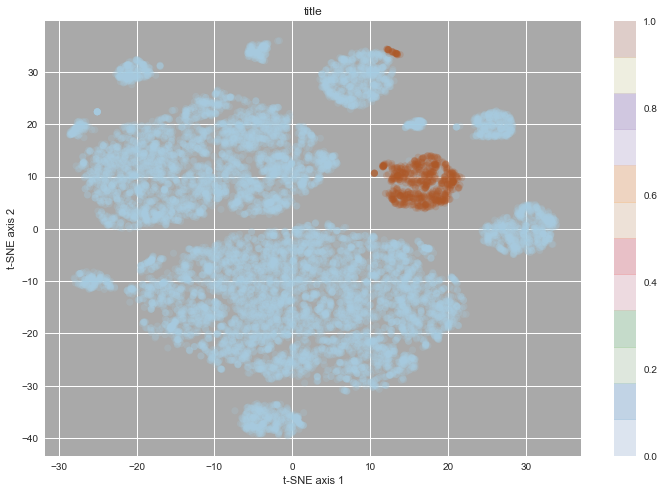

n_clusters =  3


array([0, 0, 0, ..., 0, 0, 0], dtype=int32)

silhouette =  0.0504900132715
n_clusters = 3


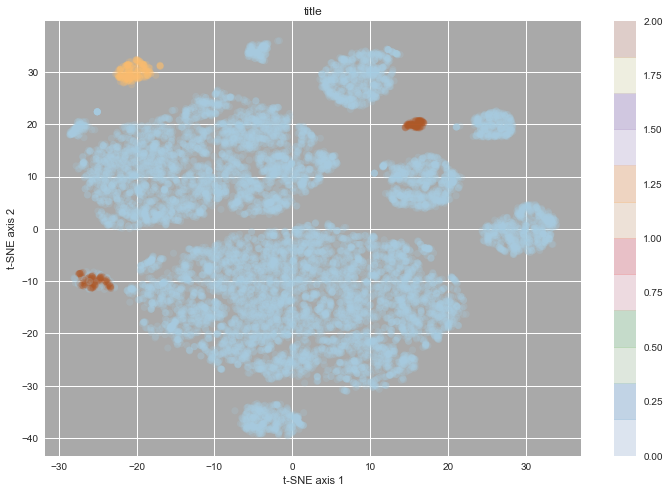

n_clusters =  4


array([1, 0, 1, ..., 1, 1, 0], dtype=int32)

silhouette =  -0.0402927125055
n_clusters = 4


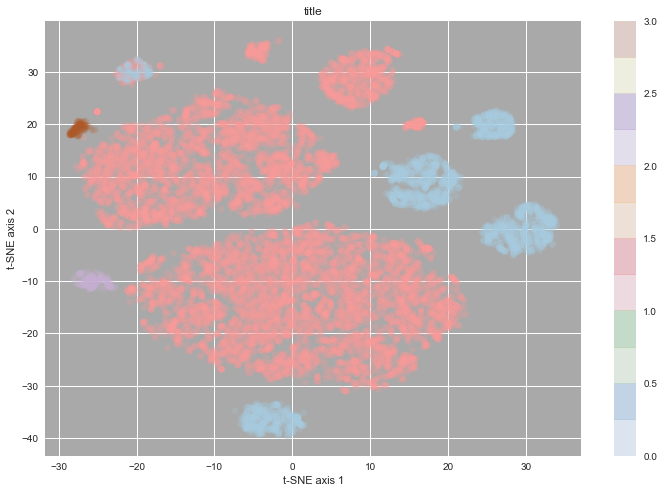

n_clusters =  5


array([2, 1, 2, ..., 0, 1, 0], dtype=int32)

silhouette =  0.0511768248978
n_clusters = 5


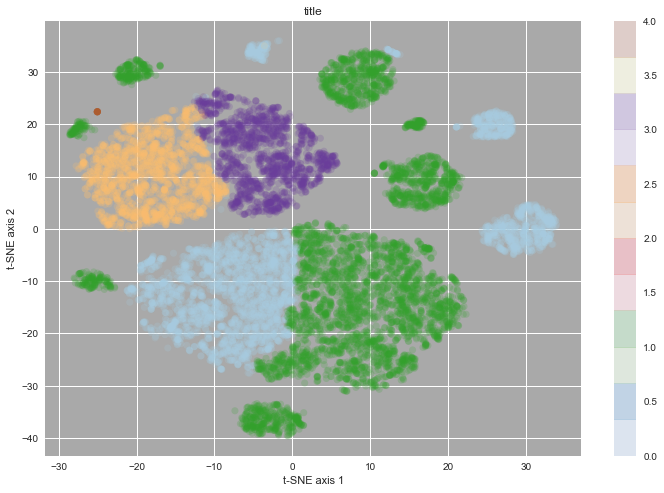

n_clusters =  6


array([3, 2, 3, ..., 1, 1, 2], dtype=int32)

silhouette =  0.0935422740346
n_clusters = 6


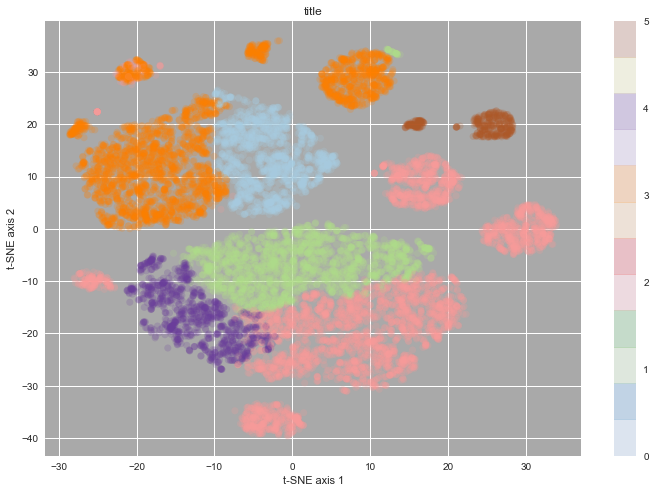

n_clusters =  7


array([1, 2, 1, ..., 0, 0, 4], dtype=int32)

silhouette =  0.00755475379566
n_clusters = 7


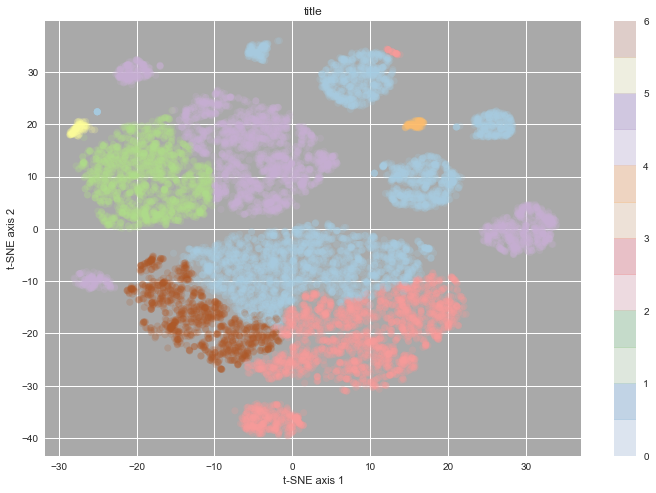

n_clusters =  8


array([5, 0, 5, ..., 2, 2, 0], dtype=int32)

silhouette =  -0.0110575481288
n_clusters = 8


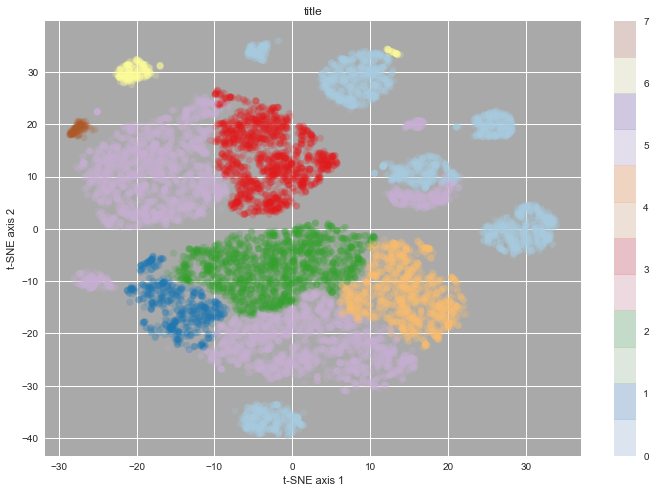

n_clusters =  9


array([2, 1, 2, ..., 8, 8, 1], dtype=int32)

silhouette =  0.0304117950391
n_clusters = 9


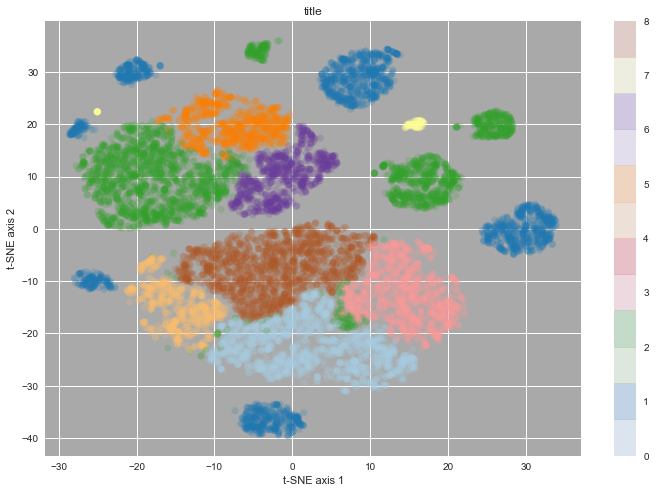

In [39]:
# ... spectraclustering on the t-sne vectors

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']


from sklearn.cluster import SpectralClustering

# If a string, this may be one of 
#  ‘nearest_neighbors’, ‘precomputed’, ‘rbf’ 
#  or one of the kernels supported by sklearn.metrics.pairwise_kernels

for n_clstr in range(2, 10):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    spc = SpectralClustering(n_clusters = n_clstr,
                             affinity = 'nearest_neighbors')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = metrics.silhouette_score(X_tsne,
                                                 spc_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {
    'model_name' : 'spc - features',
    'n_clusters' : n_clstr,
    'inertia': 0,
    'silhouette': spc_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    spc_tbl = spc_tbl.append(df_tbl)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    X_tsne_values = X_tsne.values;
    _ = plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = spc_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.colorbar();
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    title = print('n_clusters =', n_clstr);
    _ = plt.title('title')
    _ = plt.grid(True);

    _ = plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-



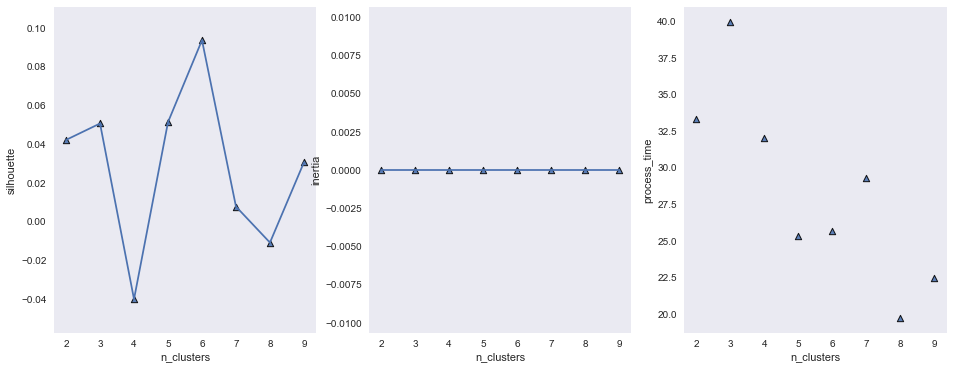

In [40]:

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(131);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(spc_tbl['n_clusters'],
         spc_tbl['silhouette'])

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
plt.grid();

# ... inertia values

plt.subplot(132);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['inertia'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(spc_tbl['n_clusters'],
         spc_tbl['inertia'])

plt.xlabel('n_clusters'), plt.ylabel('inertia');
plt.grid();

# ... process time

plt.subplot(133);
plt.scatter(spc_tbl['n_clusters'],
            spc_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

#plt.plot(spc_tbl['n_clusters'],
#         spc_tbl['process_time'])

plt.xlabel('n_clusters'), plt.ylabel('process_time');
plt.grid();


plt.show();


### - choose spectral clustering with preferred number of clusters  


In [41]:

n_clusters_chosen = 8

for n_clstr in range(n_clusters_chosen, n_clusters_chosen+1):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    spc = SpectralClustering(n_clusters = n_clstr,
                             affinity = 'nearest_neighbors')
    spc_labels = spc.fit_predict(X_tsne) 
    spc_labels
    spc_silhouette = metrics.silhouette_score(X_tsne,
                                                 spc_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", spc_silhouette)
    
    toc =  time.clock()



n_clusters =  8


/home/mcdevitt/anaconda3/lib/python3.6/site-packages/sklearn/manifold/spectral_embedding_.py:234: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


array([2, 2, 2, ..., 2, 2, 2], dtype=int32)

silhouette =  -0.0769159669646


In [42]:

X_all_together = copy.deepcopy(df_join)

len(X_all_together)

X_all_together['spc_labels'] = spc_labels

X_all_together.describe().T


11893

,count,mean,std,min,25%,50%,75%,max
x-tsne,11893.0,0.046471,14.455142,-28.600594,-10.732361,-1.353022,10.770240,33.969490
y-tsne,11893.0,-0.056760,17.569835,-39.614685,-13.960834,-0.361092,13.357964,36.012592
sample_index,11893.0,19882.864122,11489.246594,4.000000,9916.000000,19889.000000,29872.000000,39642.000000
n_tokens_title,11893.0,10.399563,2.115193,3.000000,9.000000,10.000000,12.000000,19.000000
num_keywords,11893.0,7.224081,1.907150,1.000000,6.000000,7.000000,9.000000,10.000000
data_channel_is_lifestyle,11893.0,0.052047,0.222132,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_entertainment,11893.0,0.181199,0.385199,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_socmed,11893.0,0.057092,0.232029,0.000000,0.000000,0.000000,0.000000,1.000000
kw_avg_max,11893.0,1.900997,0.996915,0.000446,1.264726,1.796301,2.431696,6.248298
weekday_is_monday,11893.0,0.166821,0.372831,0.000000,0.000000,0.000000,0.000000,1.000000


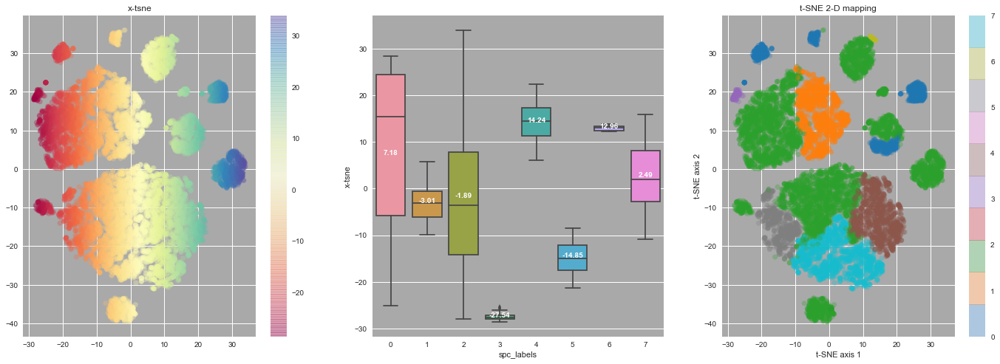

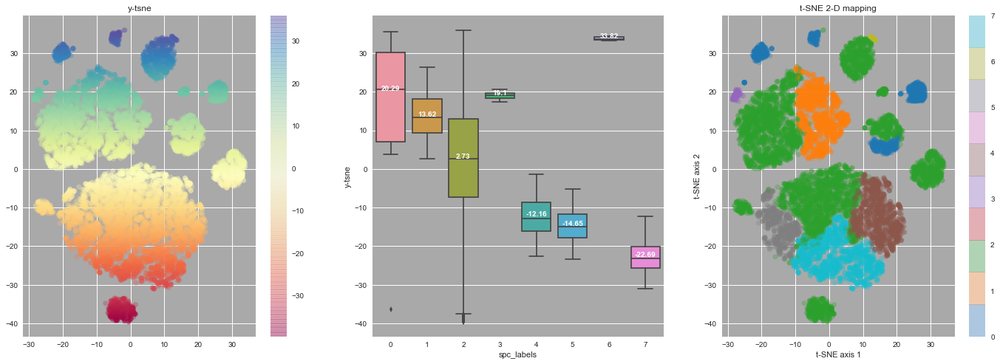

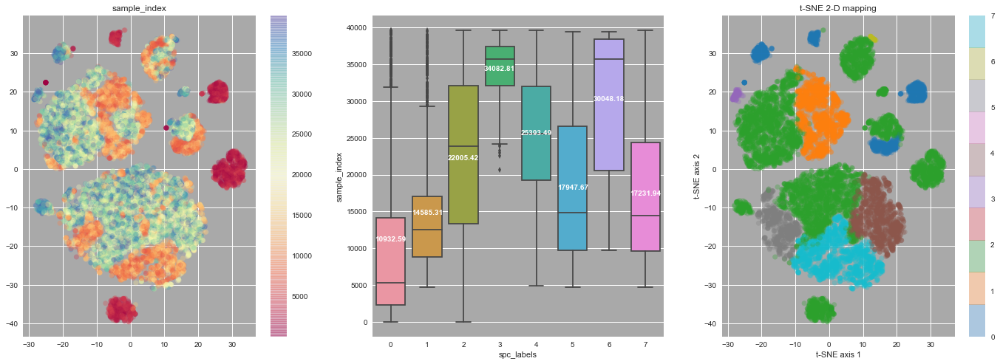

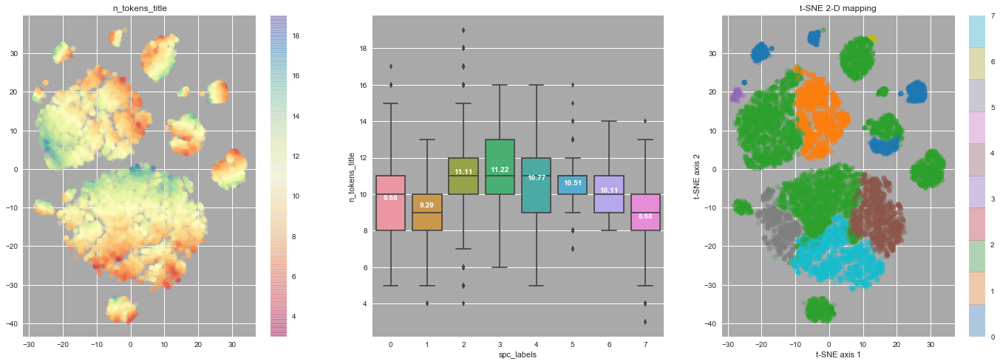

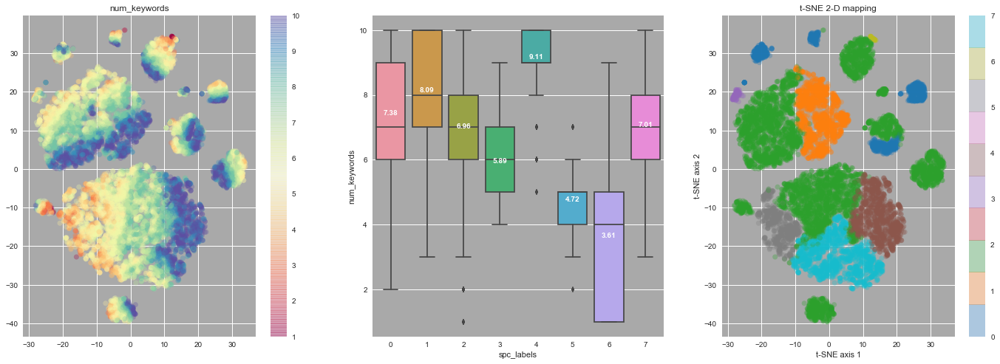

...

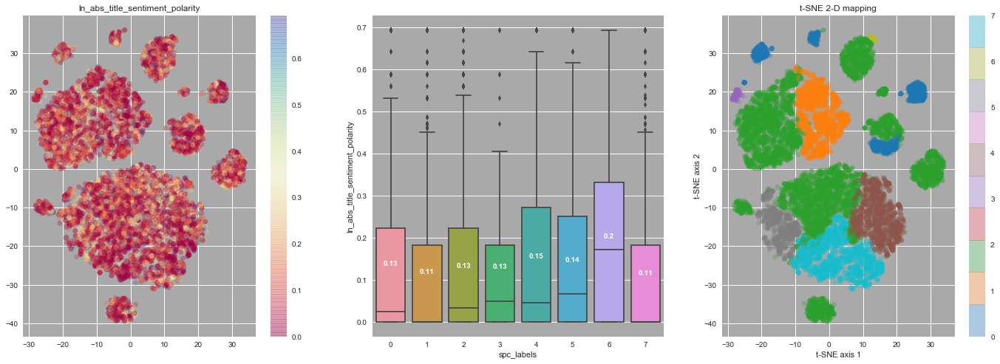

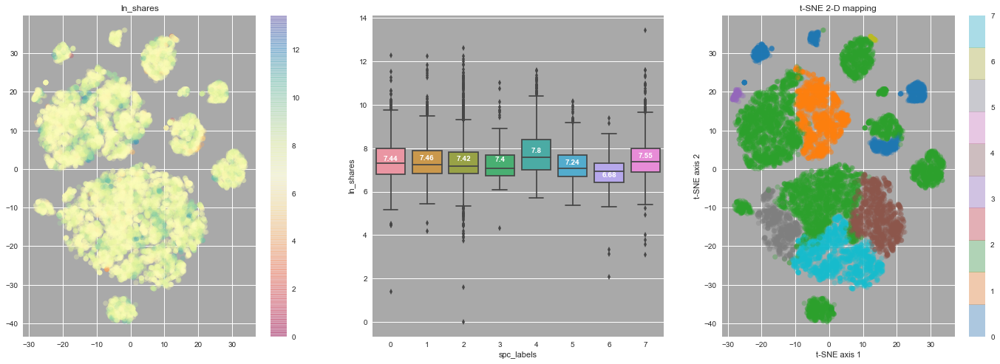

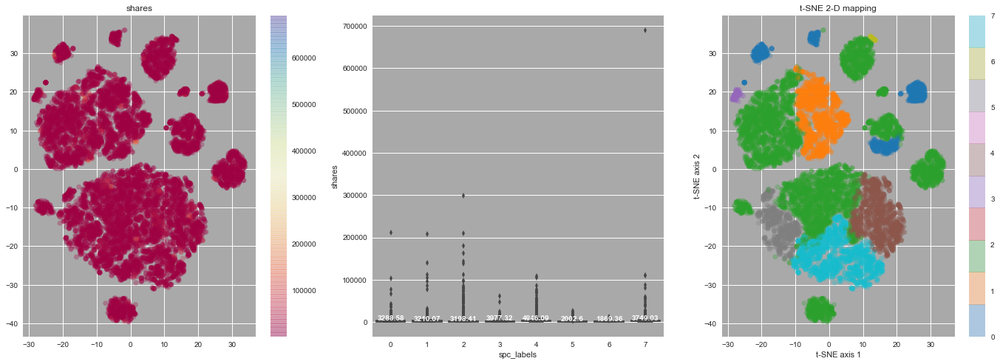

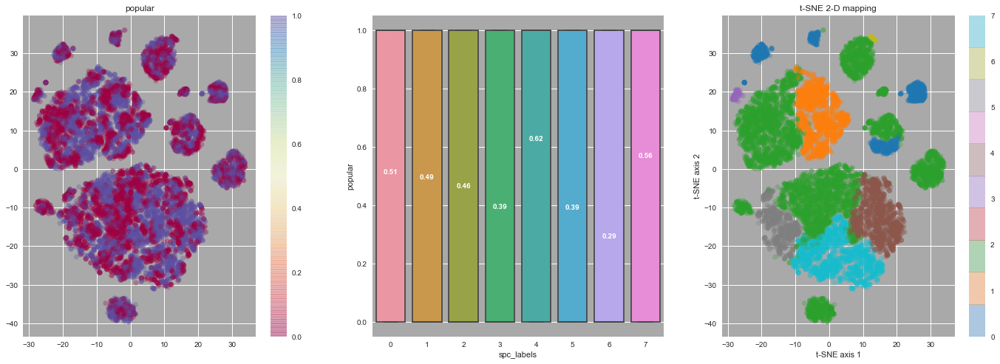

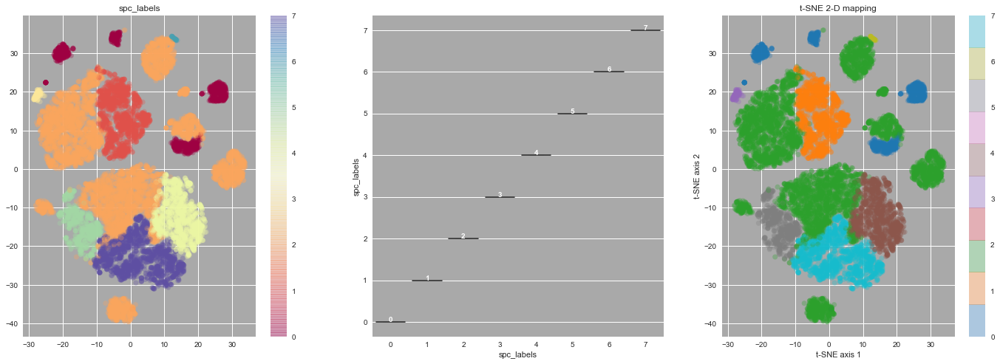

In [43]:
# boxplot across clusters for each feature ...
import seaborn as sns


col_names = X_all_together.columns.values.tolist()

for col in col_names :
    
    _ = plt.figure(figsize=(24, 8));
    
# ... feature distribution color map 

    _ = plt.subplot(131, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = X_all_together[col],
                 cmap = plt.cm.Spectral,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.colorbar()
    _ = plt.title(col)
    
# ... feature boxplots

    _ = plt.subplot(132, facecolor = 'darkgrey');
    ax = sns.boxplot(x = "spc_labels", y = col, data = X_all_together);
    
    average_values = X_all_together.groupby(['spc_labels'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

    pos = range(len(average_values))
    for tick, label in zip(pos, ax.get_xticklabels()):
        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick], 
                horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')


# ... cluster color map
    
    _ = plt.subplot(133, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = spc_labels,
                 cmap = plt.cm.tab10,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.colorbar()
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    _ = plt.title('t-SNE 2-D mapping')
 
    plt.show();
    

<a href='#toc'> Table of Contents</a>

<a name='end_of_file'></a>
<font color="blue" size=3>  end of file